# EDA Documents (Data Analysis)

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd 
import os 
import pytesseract
import math
from scipy import ndimage
import re
from typing import Tuple, Union
from pytesseract import Output
from blend_modes import divide


In [2]:
class DocumentVisualize:
    
    def pieChart(self ,cat2num = dict()) :
        # Sample data (replace this with your actual data)
        labels = list(cat2num.keys())
        numbers = list(cat2num.values())
        fig, ax = plt.subplots()
        ax.pie(numbers, labels=labels, autopct='%1.1f%%',explode = [0.1 ,0.1 ,0.1,0.1])
        ax.axis('equal')  # Equal aspect ratio ensures the pie chart is circular.
        ax.set_title('Labels Frequency')


        plt.show()
        
    #---------------------------------------------------------------------------------------
    def hv_hist_of(self ,image) :  # Plots horizontal & vertical hist of binary doc image
        image = cv2.cvtColor(image ,cv2.COLOR_BGR2GRAY)
        
        _, binary_otsu = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
        horizontal_hist = np.sum(binary_otsu, axis=1)
        vertical_hist = np.sum(binary_otsu, axis=0)

        plt.figure(figsize=(12, 6))

        plt.subplot(1, 3, 1)
        plt.title("Grayscale Image")
        plt.imshow(image, cmap='gray')

        plt.subplot(1, 3, 2)
        plt.title("Y-AXIS Histogram")
        plt.plot(horizontal_hist,range(image.shape[0]), color='r')

        plt.subplot(1, 3, 3)
        plt.title("X-AXIS Histogram")
        plt.plot(range(image.shape[1]), vertical_hist, color='r')

        plt.tight_layout()
        plt.show()

    
    
    #----------------------------------------------------------------------------------------

        
    def plot_heatmap(self, weights):
        # Convert weights to a 2D array for heatmap
        weights_array = np.array(weights).reshape(2, 2)
        weights_array/= np.max(weights_array)
        # Define custom colormap (you can choose any other colormap)
        cmap = plt.colormaps['YlOrRd']

        # Create the heatmap
        plt.figure(figsize=(6, 6))
        heatmap = plt.imshow(weights_array, cmap=cmap, interpolation='nearest', vmin=0, vmax=1)

        # Add colorbar
        cbar = plt.colorbar(heatmap, fraction=0.046, pad=0.04)
        cbar.set_label('Weights')

        # Add axis labels
        plt.xticks(np.arange(2), ['Region 1', 'Region 2'])
        plt.yticks(np.arange(2), ['Region 1', 'Region 2'])


        # Add a title
        plt.title('Distribution of plates in image')

        # Show the plot
        plt.tight_layout()
        plt.show()

In [3]:
base_paths = [os.path.join('data/base-images',path) for path in os.listdir('data/base-images/') if path !='.ipynb_checkpoints']
sample_paths = [os.path.join('data/sample-images/',path) for path in os.listdir('data/sample-images//') if path !='.ipynb_checkpoints']

In [4]:
print('Number of Documetns : {}'.format(len(base_paths)+len(sample_paths)))

Number of Documetns : 209


In [5]:
print("Number of sample Documetns : {}".format(len(sample_paths)))

Number of sample Documetns : 6


In [6]:
sample_paths

['data/sample-images/data_1.jpg',
 'data/sample-images/data_1_ground_truth.jpg',
 'data/sample-images/data_34.jpg',
 'data/sample-images/data_3_ground_truth.jpg',
 'data/sample-images/data_3.jpg',
 'data/sample-images/data_34_ground_truth.jpg']

In [7]:
sample_paths = [path for path in sample_paths if not path.endswith('_ground_truth.jpg')]
gt_paths = [path[:path.rfind('.')] + '_ground_truth.jpg' for path in sample_paths]


## Let's look at sample images 

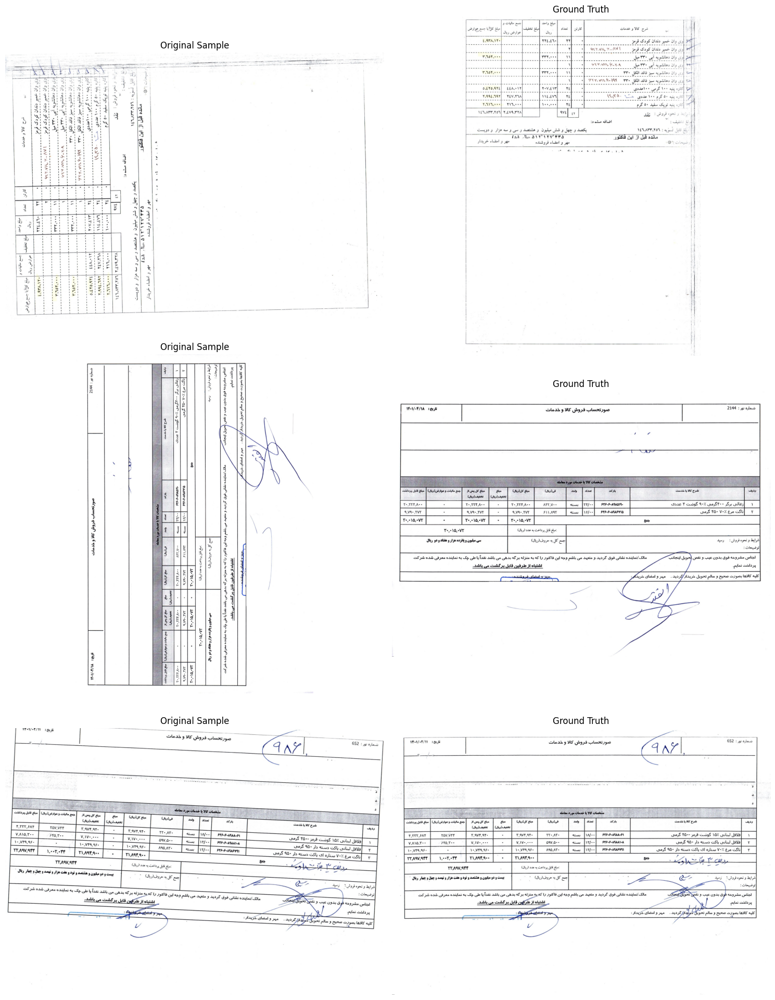

In [8]:
fig, axes = plt.subplots(len(sample_paths), 2, figsize=(15, 20))

for i in range(len(sample_paths)):
    original_sample = cv2.imread(sample_paths[i])
    ground_truth = cv2.imread(gt_paths[i])
    
    axes[i, 0].imshow(original_sample[...,::-1])
    axes[i, 0].set_title('Original Sample')
    axes[i, 0].axis('off')
    
    axes[i, 1].imshow(ground_truth[...,::-1])
    axes[i, 1].set_title('Ground Truth')
    axes[i, 1].axis('off')
plt.tight_layout()
plt.show()

#### Using pytesseract (Just for labeling (this is slow method))
#### * orientation(270) --> right2left       |      orientation(90) --> left2right     |     orientation(180) --> down2up   *

In [8]:
def orient_image(image, orientation_degree):
    if orientation_degree == 90:
        # Rotate each channel separately
        image = [cv2.flip(channel.T, 0) for channel in cv2.split(image)]
        image = cv2.merge(image)
    elif orientation_degree == 180:
        image = cv2.flip(image, -1)
    elif orientation_degree == 270:
        image = [cv2.flip(channel.T, 1) for channel in cv2.split(image)]
        image = cv2.merge(image)

    return image




def get_image_orient(image) :
    
    osd_info = pytesseract.image_to_osd(image)
    rotate_index = osd_info.split().index('degrees:')+1
    rotation_angle = float(osd_info.split()[rotate_index])
    
    return int(rotation_angle)

In [9]:
degree2orient = {270:'right2left' ,90:'left2right' ,180:'up2down' ,0:'down2up'}
image_with_orient = {key_:list() for key_ in degree2orient.values()}

In [10]:
orient2degree = {value:key for key ,value in degree2orient.items()}

In [11]:
zad = image_with_orient

In [12]:
for index ,doc_path in enumerate(base_paths) :
    doc_image = cv2.imread(doc_path, cv2.COLOR_BGR2GRAY)
    angle = get_image_orient(doc_image)
    image_with_orient[degree2orient[angle]].append(doc_path)

## Data Analysis

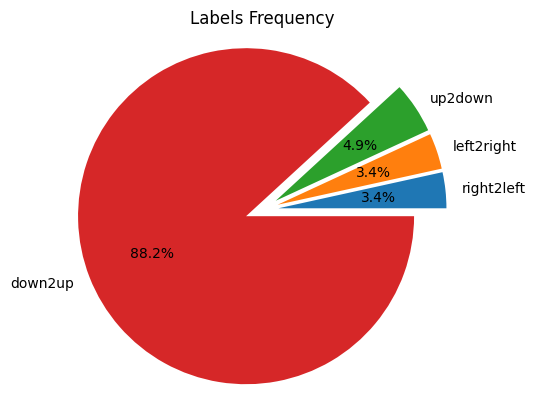

In [220]:
plot_dict = dict()
for key ,value in image_with_orient.items() :
    plot_dict[key] = len(value)


visualizer = DocumentVisualize()

visualizer.pieChart(plot_dict)

#### Based of below images you'll see that recognizing of that document is horizontal or vertical can be easy 



****    ----------right2left----------    ****






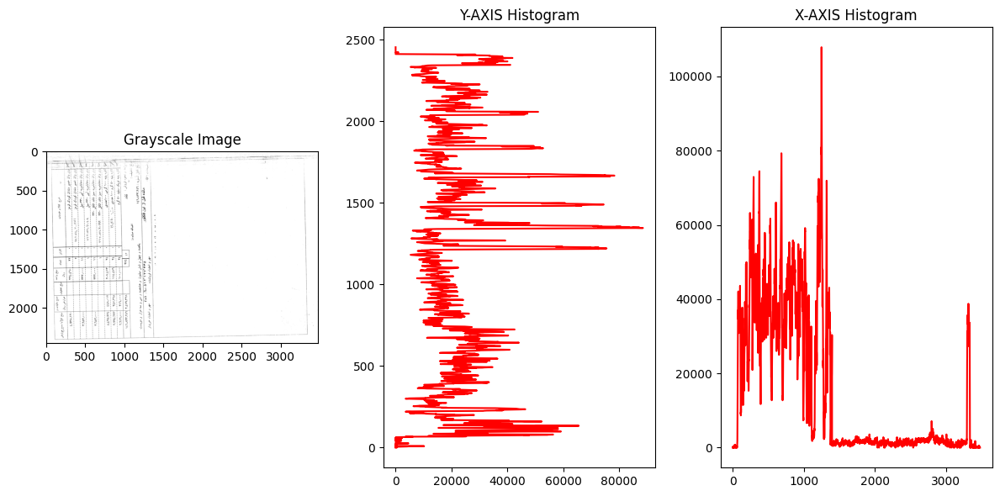



****    ----------left2right----------    ****






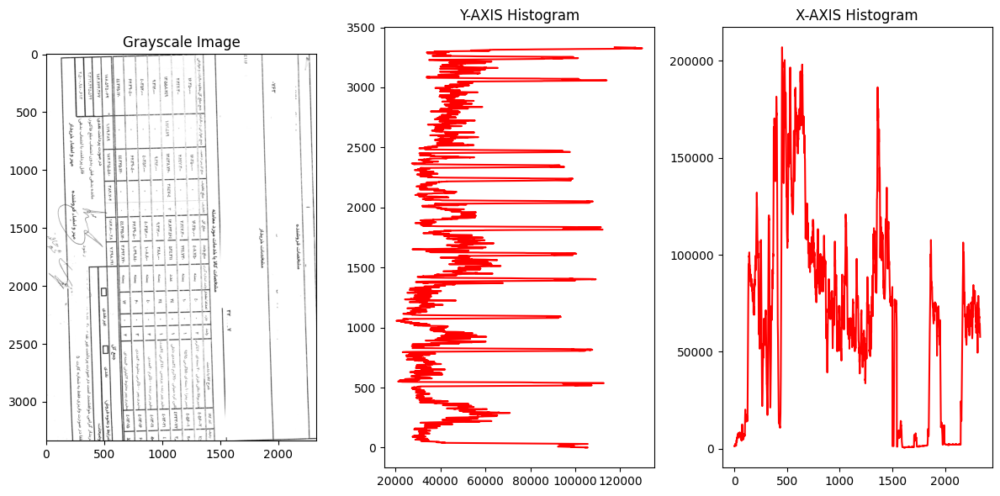



****    ----------up2down----------    ****






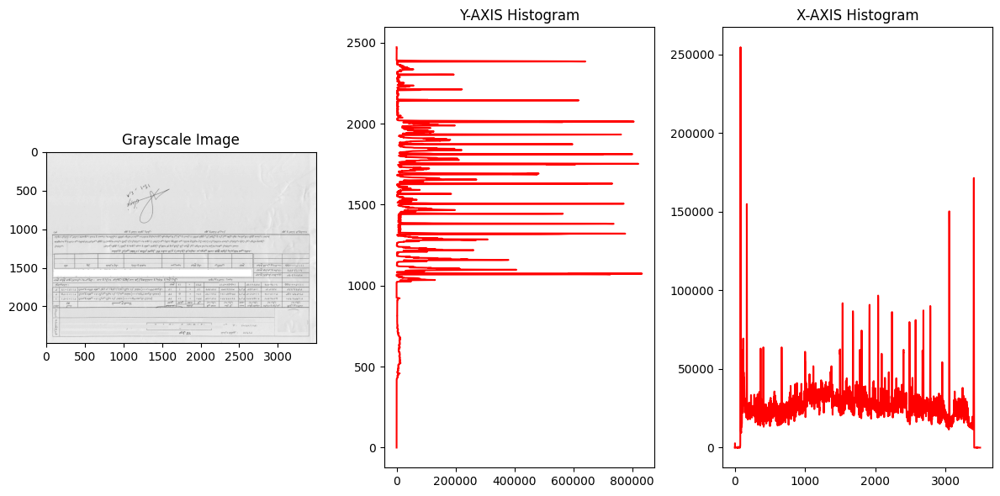



****    ----------down2up----------    ****




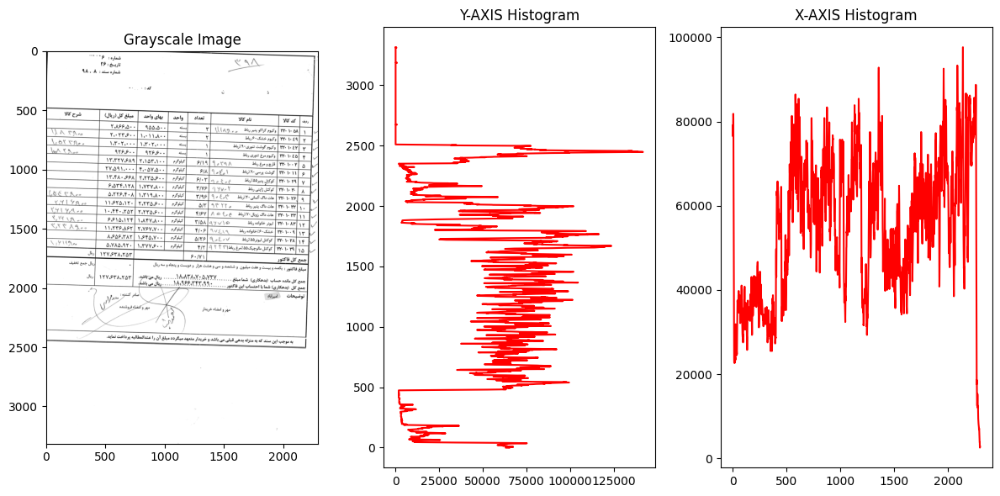

In [60]:
orientation = 'right2left'
print(f'\n\n****    ----------{orientation}----------    ****\n\n\n\n')

random_index = np.random.randint(1, len(image_with_orient[orientation]))
image = cv2.imread(image_with_orient[orientation][random_index])
visualizer.hv_hist_of(image) 


orientation = 'left2right'
print(f'\n\n****    ----------{orientation}----------    ****\n\n\n\n')
random_index = np.random.randint(1, len(image_with_orient[orientation]))
image = cv2.imread(image_with_orient[orientation][random_index])
visualizer.hv_hist_of(image)


orientation = 'up2down'
print(f'\n\n****    ----------{orientation}----------    ****\n\n\n\n')

random_index = np.random.randint(1, len(image_with_orient[orientation]))
image = cv2.imread(image_with_orient[orientation][random_index])
visualizer.hv_hist_of(image) 


orientation = 'down2up'
print(f'\n\n****    ----------{orientation}----------    ****\n\n')
random_index = np.random.randint(1, len(image_with_orient[orientation]))
image = cv2.imread(image_with_orient[orientation][random_index])
visualizer.hv_hist_of(image) 

* As you can see recognize that document is horizaontal or vertical would be easy with histograms 

# <span style="font-size: 80px;">&#9733;</span> Orientation Detection with tunned MobileNetv2 + MLP <span style="font-size: 80px;">&#9733;</span>
## Training Notebook for this method is available

1/1 [==============================] - 0s 337ms/step
Estimated Inf Time on cpu: 389.653 ms
Model says original image orientation is : right2left





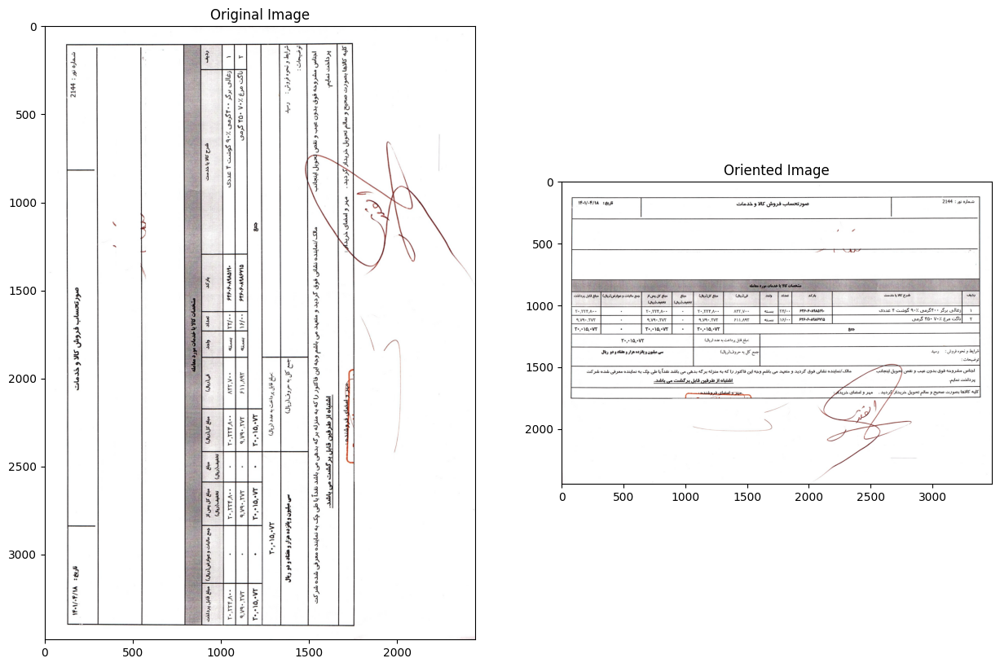

In [66]:
import tensorflow as tf
import cv2
import numpy as np
import os
import time
import warnings
warnings.filterwarnings('ignore')


model_label2name = {0:'down2up', 1:'up2down' ,2:'right2left',3:'left2right'}
orient2degree = {'right2left': 270, 'left2right': 90, 'up2down': 180, 'down2up': 0}


def get_oriented_image(image, orientation_degree):
    if orientation_degree == 90:
        # Rotate each channel separately
        image = [cv2.flip(channel.T, 0) for channel in cv2.split(image)]
        image = cv2.merge(image)
    elif orientation_degree == 180:
        image = cv2.flip(image, -1)
    elif orientation_degree == 270:
        image = [cv2.flip(channel.T, 1) for channel in cv2.split(image)]
        image = cv2.merge(image)

    return image


def load_and_preprocess_image(image):    
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    image = cv2.resize(image, (612, 612))
    
    image = image.astype(np.float32)
    
    image = (image / 127.5) - 1

    return image


def predict_and_orient_image(image_path, model, preprocess_func, model_label2name, orient2degree):
    
    
    image = cv2.imread(image_path)
    preprocessed_image = preprocess_func(image)

    input_image_batch = np.expand_dims(preprocessed_image, 0)

    # Predict using the CPU
    with tf.device('/CPU:0'):
        predictions = model.predict(input_image_batch)
        class_name = model_label2name[np.argmax(predictions[0])]
        oriented_image = get_oriented_image(image, orient2degree[class_name])
    
    print('Model says original image orientation is : {}\n\n\n'.format(class_name))
    
    return oriented_image


model = tf.keras.models.load_model('models/saved_model/')
image = cv2.imread(sample_paths[1])
preprocessed_image = load_and_preprocess_image(image)

input_image_batch = np.expand_dims(preprocessed_image ,0)

# Predict using the CPU
with tf.device('/CPU:0'):
    start_time = time.time()
    predictions = model.predict(input_image_batch)
    class_name = model_label2name[np.argmax(predictions[0])]
    oriented_image = get_oriented_image(image ,orient2degree[class_name])
    print('Estimated Inf Time on cpu:',round((time.time() - start_time)*1000 ,3) ,'ms')
print('Model says original image orientation is : {}\n\n\n'.format(class_name))
plt.figure(figsize=(15, 15))
plt.subplot(1,2,1);plt.title('Original Image');plt.imshow(image ,cmap = 'gray');
plt.subplot(1,2,2);plt.title('Oriented Image');plt.imshow(oriented_image ,cmap = 'gray');


# Finding Text Blobs (just for experiment)

#### Otsu's thresholding method --> GaussianBlur --> MORPH_BLACKHAT --> Scharr gradient of the blackhat --> MORPH_CLOSE --> erode --> findContours --> sort and find blobs

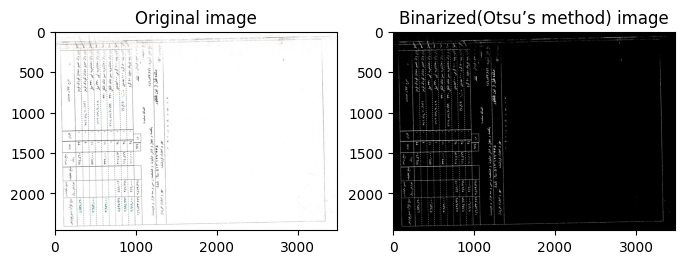

In [16]:
image_index = np.random.randint(0 ,len(base_paths))
image = cv2.imread(base_paths[image_index])
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

thresh = cv2.threshold(gray, 0, 255,cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]

plt.figure(figsize=(8, 10))
plt.subplot(1,2,1);plt.title('Original image');plt.imshow(image ,cmap = 'gray');
plt.subplot(1,2,2);plt.title('Binarized(Otsu’s method) image');plt.imshow(thresh ,cmap = 'gray');

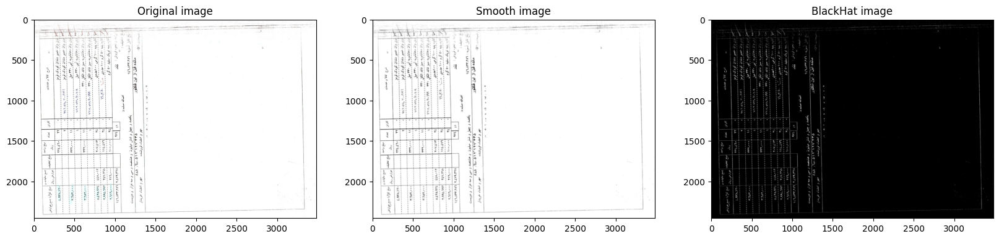

In [17]:
image = cv2.imread(base_paths[image_index])

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
(H, W) = gray.shape

# initialize a rectangular and square structuring kernel
rectKernel = cv2.getStructuringElement(cv2.MORPH_RECT, (25,7))
sqKernel = cv2.getStructuringElement(cv2.MORPH_RECT, (21, 21))

# smooth the image using a 3x3 Gaussian blur and then apply a
# blackhat morpholigical operator to find dark regions on a light background
gray = cv2.GaussianBlur(gray, (13, 13), 0)
blackhat = cv2.morphologyEx(gray, cv2.MORPH_BLACKHAT, rectKernel)
plt.figure(figsize=(20, 15))
plt.subplot(1,3,1);plt.title('Original image');plt.imshow(image ,cmap = 'gray');
plt.subplot(1,3,2);plt.title('Smooth image');plt.imshow(gray ,cmap = 'gray');
plt.subplot(1,3,3);plt.title('BlackHat image');plt.imshow(blackhat ,cmap = 'gray');


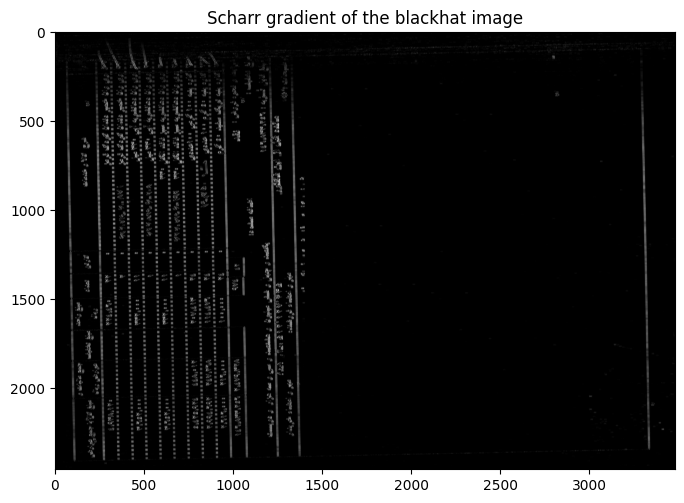

In [18]:
grad = cv2.Sobel(blackhat, ddepth=cv2.CV_32F, dx=1, dy=0, ksize=-1)
grad = np.absolute(grad)
(minVal, maxVal) = (np.min(grad), np.max(grad))
grad = (grad - minVal) / (maxVal - minVal)
grad = (grad * 255).astype("uint8")
plt.figure(figsize=(8, 10))
plt.subplot(1,1,1);plt.title('Scharr gradient of the blackhat image');plt.imshow(grad ,cmap = 'gray');

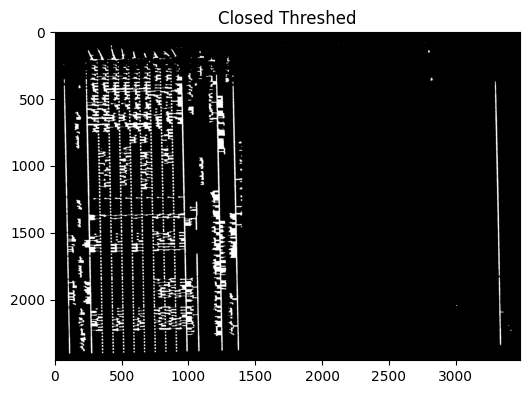

In [19]:
# apply a closing operation using the rectangular kernel to close gaps in between letters -- then apply Otsu's thresholding method
grad = cv2.morphologyEx(grad, cv2.MORPH_CLOSE, rectKernel)
thresh = cv2.threshold(grad, 0, 255,cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
plt.figure(figsize=(6, 8))
plt.subplot(1,1,1);plt.title('Closed Threshed');plt.imshow(thresh ,cmap = 'gray');

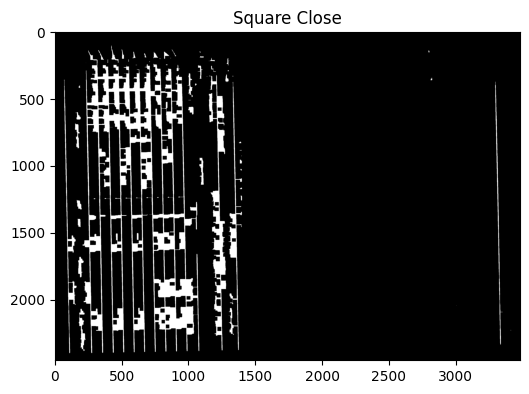

In [20]:
thresh = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, sqKernel)
thresh = cv2.erode(thresh, None, iterations=2)
plt.figure(figsize=(6, 8))
plt.subplot(1,1,1);plt.title('Square Close');plt.imshow(thresh ,cmap = 'gray');


In [24]:
import imutils
from imutils.contours import sort_contours

cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = imutils.grab_contours(cnts)
cnts = sort_contours(cnts, method="bottom-to-up")[0]

Box = None

for c in cnts:
    # compute the bounding box of the contour and then derive the how much of the image the bounding box occupies in terms of
    # both width and height

    (x, y, w, h) = cv2.boundingRect(c)

    percentWidth = w / float(W)

    percentHeight = h / float(H)

    if percentWidth > 0.6 and percentHeight > 0.6:
        Box = (x, y, w, h)
        break

In [25]:
import sys
# pad the bounding box since we applied erosions and now need to

box = None
if Box is None:
    print("[INFO] Box could not be found")
else:
    (x, y, w, h) = Box
    pX = int((x + w) * 0.03)
    pY = int((y + h) * 0.03)
    (x, y) = (x - pX, y - pY)
    (w, h) = (w + (pX * 2), h + (pY * 2))

    box = image[y:y + h, x:x + w]

[INFO] Box could not be found


In [ ]:
plt.figure(figsize=(6, 8))
plt.subplot(1,1,1);plt.title('Square Close');plt.imshow(box ,cmap = 'gray');

# Finding Box of Rotated Text Deep Learning Model

### Using EAST Pretrained Model

<img src="./Papers/Screenshot from 2023-10-21 22-49-32.png" />

### Use Pretrained model Feature Maps and Unet concepts to achieve rotate angle 

In [238]:
from imutils.object_detection import non_max_suppression
import shutil


In [239]:
def rotate_image(image ,angle) :
    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)
    m = cv2.getRotationMatrix2D(center, angle, 1.0)  
    corrected = cv2.warpAffine(image, m, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)  
    return corrected



def decode_predictions(scores, geometry, minConf=0.5):
    # grab the number of rows and columns from the scores volume, then
    # initialize our set of bounding box rectangles and corresponding
    # confidence scores
    (numRows, numCols) = scores.shape[2:4]
    rects = []
    confidences = []
    angles = []

    for y in range(0, numRows):
        # extract the scores (probabilities), followed by the geometrical
        # data used to derive potential bounding box coordinates that surround text
        scoresData = scores[0, 0, y]
        xData0 = geometry[0, 0, y]
        xData1 = geometry[0, 1, y]
        xData2 = geometry[0, 2, y]
        xData3 = geometry[0, 3, y]
        anglesData = geometry[0, 4, y]
        
        # loop over the number of columns
        for x in range(0, numCols):
            # if our score does not have sufficient probability, ignore it
            if scoresData[x] < minConf:
                continue

            # compute the offset factor as our resulting feature maps will
            # be 4x smaller than the input image
            (offsetX, offsetY) = (x * 4.0, y * 4.0)

            # extract the rotation angle for the prediction and then
            # compute the sin and cosine
            angle = anglesData[x]
            angles.append(angle)
            cos = np.cos(angle)
            sin = np.sin(angle)

            # use the geometry volume to derive the width and height of
            # the bounding box
            h = xData0[x] + xData2[x]
            w = xData1[x] + xData3[x]

            # compute both the starting and ending (x, y)-coordinates for
            # the text prediction bounding box
            endX = int(offsetX + (cos * xData1[x]) + (sin * xData2[x]))
            endY = int(offsetY - (sin * xData1[x]) + (cos * xData2[x]))
            startX = int(endX - w)
            startY = int(endY - h)

            # add the bounding box coordinates and probability score to
            # our respective lists
            rects.append((startX, startY, endX, endY))
            confidences.append(scoresData[x])
    return (rects, confidences) ,angles




def east_perdict_angle(net ,image) :
    H ,W ,x = 0 ,0 ,0
    if len(image.shape) == 3 :
        H,W,_ = image.shape
    else :
        H,W, = image.shape
    new_h = H if H % 32 == 0 else (H // 32) * 32
    new_w = W if W % 32 == 0 else (W // 32) * 32

    blob = cv2.dnn.blobFromImage(image, 1.0, (new_w, new_h),
                                 (123.68, 116.78, 103.94), swapRB=True, crop=False)
    net.setInput(blob)
    (scores, geometry) = net.forward(layerNames)
    (rects, confidences) ,angles = decode_predictions(scores, geometry,0.9)
    
    return angles

In [240]:
# The first layer name is the output probabilities 
# second layer name --> get bounding box coordinates of text

image_index = np.random.randint(0 ,len(base_paths))
side = 'left2right'
image = image_with_orient[side][4]
image_orient = orient2degree[side]

image = cv2.imread(image)
org = image.copy()
(H, W) = image.shape[:2]


new_h = H if H % 32 == 0 else (H // 32) * 32
new_w = W if W % 32 == 0 else (W // 32) * 32

layerNames = [
    "feature_fusion/Conv_7/Sigmoid",
    "feature_fusion/concat_3"]


net = cv2.dnn.readNet('models/frozen_east_text_detection.pb')


print("[INFO] loading EAST text detector...")


[INFO] loading EAST text detector...


In [241]:
# decode the predictions form OpenCV's EAST text detector and then ,NMS

oriented_image = orient_image(image ,image_orient)

angles = east_perdict_angle(net ,oriented_image)
print('rotate_angle = ' ,np.mean(angles))
rotated_image = rotate_image(oriented_image ,np.mean(angles))

rotate_angle =  0.03792291


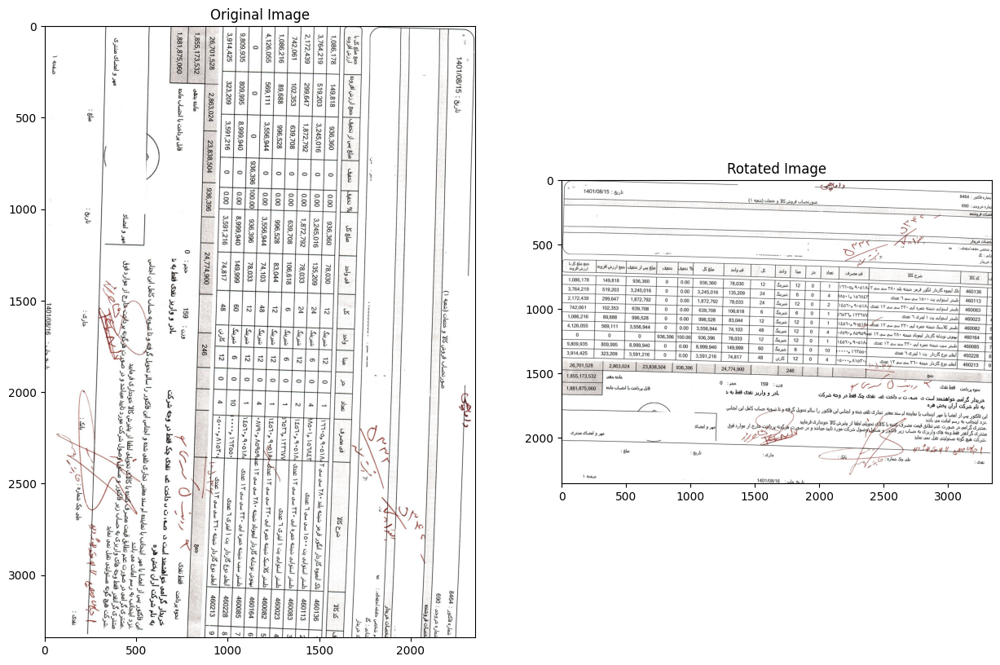

In [244]:
plt.figure(figsize=(15, 15))
plt.subplot(1,2,1);plt.title('Original Image');plt.imshow(org ,cmap = 'gray');
plt.subplot(1,2,2);plt.title('Rotated Image');plt.imshow(rotated_image ,cmap = 'gray');

In [234]:
rgb_image = cv2.imread(sample_paths[1])[... ,::-1]
org = rgb_image.copy()
gray = cv2.cvtColor(rgb_image ,cv2.COLOR_BGR2GRAY)
angle = get_image_orient(gray)
oriented_image = orient_image(rgb_image ,angle)
print('image shape : ' ,rgb_image.shape)

print('Oriented image : ' ,oriented_image.shape)

angles = east_perdict_angle(net ,oriented_image) 
image = rotate_image(oriented_image,np.mean(angles))

image shape :  (3484, 2445, 3)
Oriented image :  (2445, 3484, 3)


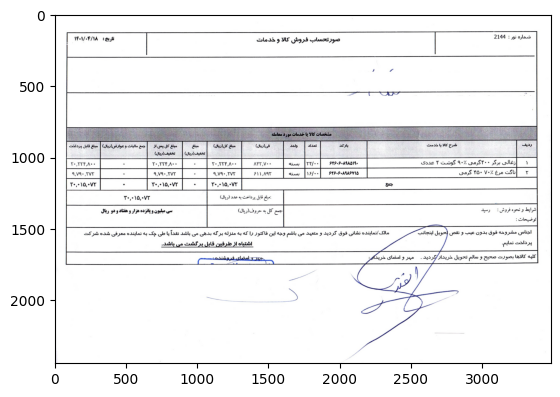

In [237]:
plt.imshow(image)

In [176]:
img.reshape(oriented_image.shape+(3,)).shape

(2445, 3484, 3)

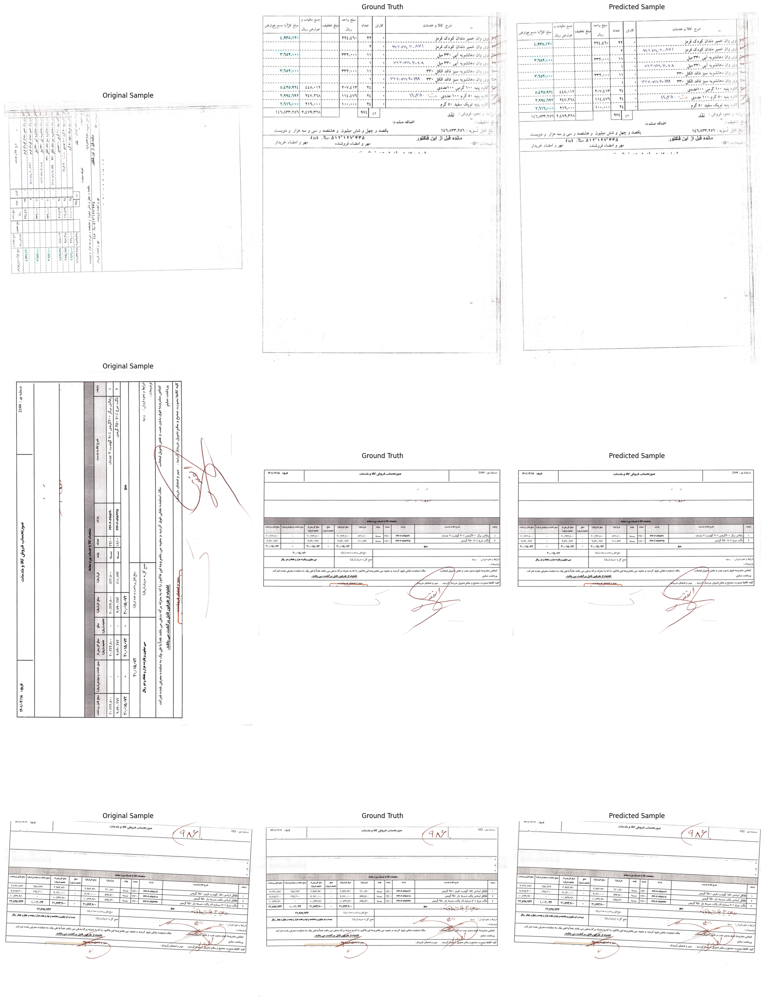

In [245]:
fig, axes = plt.subplots(len(sample_paths), 3, figsize=(20, 30))

for i in range(len(sample_paths)):

    img = cv2.imread(sample_paths[i], cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    original_sample = img.copy()
    ground_truth = cv2.imread(gt_paths[i] ,cv2.COLOR_BGR2GRAY)

    angle = get_image_orient(img)
    oriented_image = orient_image(img ,angle)
    angles = east_perdict_angle(net ,oriented_image)
    rotated_image = rotate_image(oriented_image ,np.mean(angles))

    axes[i, 0].imshow(original_sample ,cmap = 'gray')
    axes[i, 0].set_title('Original Sample')
    axes[i, 0].axis('off')
    
    axes[i, 1].imshow(ground_truth,cmap = 'gray')
    axes[i, 1].set_title('Ground Truth')
    axes[i, 1].axis('off')

    axes[i, 2].imshow(rotated_image,cmap = 'gray')
    axes[i, 2].set_title('Predicted Sample')
    axes[i, 2].axis('off')

plt.tight_layout()
plt.show()

# Detect Boxes that has high IOU with Image (Just for Experiment)

#### MORPH_GRADIENT with Eliipse --> THRESH_BINARY | THRESH_OTSU --> MORPH_CLOSE with Ellipse --> findContours --> Get top plyRect --> getRotation

In [246]:
#rotate the image with given theta value
def rotate(img, theta):
    rows, cols = img.shape[0], img.shape[1]
    image_center = (cols/2, rows/2)
    
    M = cv2.getRotationMatrix2D(image_center,theta,1)

    abs_cos = abs(M[0,0])
    abs_sin = abs(M[0,1])

    bound_w = int(rows * abs_sin + cols * abs_cos)
    bound_h = int(rows * abs_cos + cols * abs_sin)

    M[0, 2] += bound_w/2 - image_center[0]
    M[1, 2] += bound_h/2 - image_center[1]

    # rotate orignal image to show transformation
    rotated = cv2.warpAffine(img,M,(bound_w,bound_h),borderValue=(255,255,255))
    return rotated


def slope(x1, y1, x2, y2):
    if x1 == x2:
        return 0
    slope = (y2-y1)/(x2-x1)
    print(slope)
    theta = np.rad2deg(np.arctan(slope))
    return theta


In [304]:
image_index = np.random.randint(0 ,len(base_paths))
image = cv2.imread(base_paths[image_index])
org_image = image.copy()
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

orient = get_image_orient(gray)
image = orient_image(image ,orient)

In [305]:
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
grad = cv2.morphologyEx(gray, cv2.MORPH_GRADIENT, kernel)

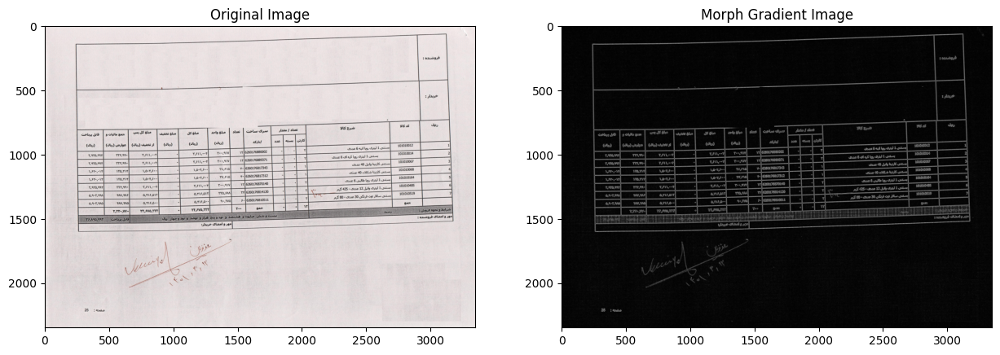

In [306]:
plt.figure(figsize=(15, 15))
plt.subplot(1,2,1);plt.title('Original Image');plt.imshow(image ,cmap = 'gray');
plt.subplot(1,2,2);plt.title('Morph Gradient Image');plt.imshow(grad ,cmap = 'gray');

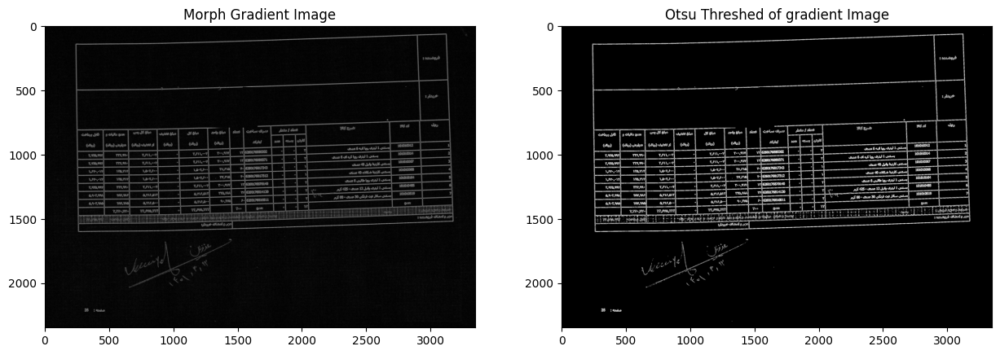

In [307]:
_, bw = cv2.threshold(grad, 0.0, 255.0, cv2.THRESH_BINARY | cv2.THRESH_OTSU)



plt.figure(figsize=(15, 15))
plt.subplot(1,2,1);plt.title('Morph Gradient Image');plt.imshow(grad ,cmap = 'gray');
plt.subplot(1,2,2);plt.title('Otsu Threshed of gradient Image');plt.imshow(bw ,cmap = 'gray');

important note the when the kernel is defined with shape (x,y) it will be (y ,x) in use of it !!!    Be Carefull 

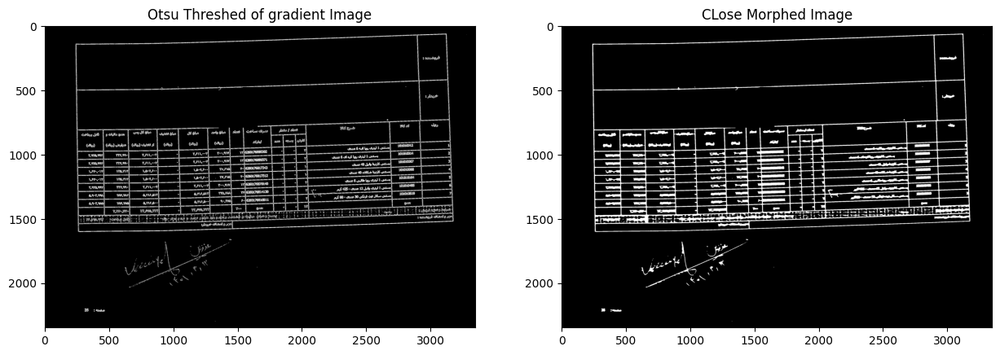

In [308]:
#connect horizontally oriented regions

kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (15,5))
connected = cv2.morphologyEx(bw, cv2.MORPH_CLOSE, kernel)


plt.figure(figsize=(15, 15))
plt.subplot(1,2,1);plt.title('Otsu Threshed of gradient Image');plt.imshow(bw ,cmap = 'gray');
plt.subplot(1,2,2);plt.title('CLose Morphed Image');plt.imshow(connected ,cmap = 'gray');

In [309]:
contours, hierarchy = cv2.findContours(connected.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE) #opencv >= 4.0
print("Number of contours detected : {}".format(len(contours)))

Number of contours detected : 56


In [310]:
mask = np.zeros(bw.shape, dtype=np.uint8)

image_height ,image_width = image.shape[:-1]

cummTheta = []

#number of detected text regions
num_cnt = 0

for idx in range(len(contours)):
    
    x, y, w, h = cv2.boundingRect(contours[idx])
    mask[y:y+h, x:x+w] = 0
    
    
    #fill the contour
    cv2.drawContours(mask, contours, idx, (255, 255, 255), -1)
    
    #ratio of non-zero pixels in the filled region
    r = float(cv2.countNonZero(mask[y:y+h, x:x+w])) / (w * h)
    if w > image_height / 3 and h > image_width / 3:

        rect = cv2.minAreaRect(contours[idx])
        box = cv2.boxPoints(rect)
        box = np.intp(box)
        cv2.drawContours(image,[box],0,(0,0,255),2)

        #we can filter theta as outlier based on other theta values 
        #this will help in excluding the rare text region with different orientation from usual value 
        # in the next cell I'll do outlier detection 
        print(box)
        theta = slope(box[0][0], box[0][1], box[1][0], box[1][1])
        cummTheta.append(theta)
        num_cnt +=1 


[[ 218  143]
 [3134   64]
 [3175 1537]
 [ 258 1617]]
-0.02709190672153635


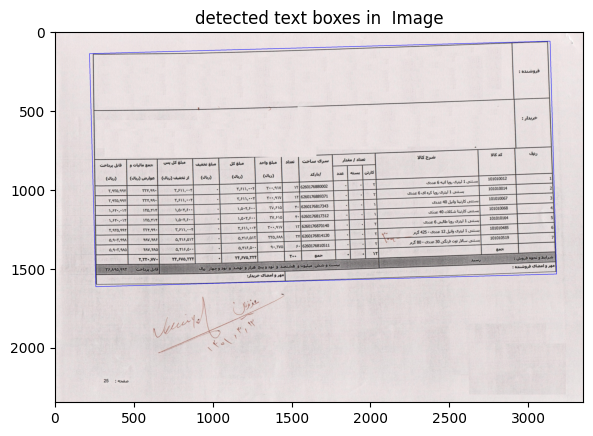

In [311]:
plt.figure(figsize=(15, 15))
plt.subplot(1,2,1);plt.title('detected text boxes in  Image');plt.imshow(image ,cmap = 'gray');


In [312]:
cummTheta

[-1.551872311753895]

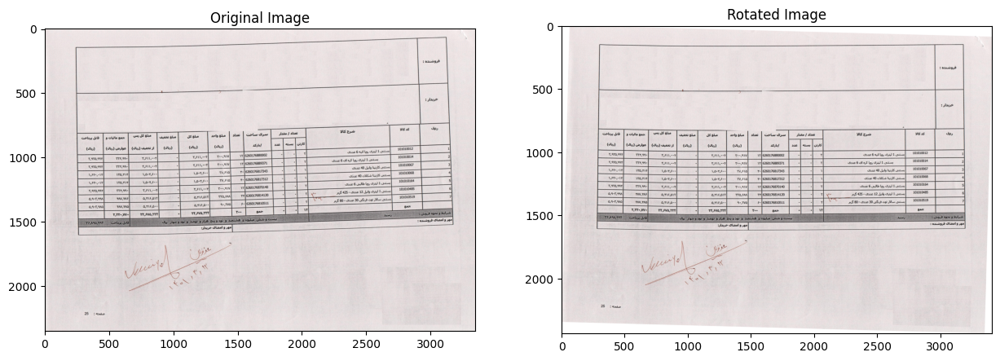

In [313]:
final_rotate_angle = np.mean(cummTheta)
if -90 <final_rotate_angle < -45 :
    final_rotate_angle = (90+final_rotate_angle)
rotated_image = rotate(org_image ,final_rotate_angle)

plt.figure(figsize=(15, 15))
plt.subplot(1,2,1);plt.title('Original Image');plt.imshow(org_image ,cmap = 'gray');
plt.subplot(1,2,2);plt.title('Rotated Image');plt.imshow(rotated_image ,cmap = 'gray');

In [322]:
def rotate_image(img) :
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
    grad = cv2.morphologyEx(gray, cv2.MORPH_GRADIENT, kernel)
    _, bw = cv2.threshold(grad, 0.0, 255.0, cv2.THRESH_BINARY | cv2.THRESH_OTSU)

    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (15,5))
    connected = cv2.morphologyEx(bw, cv2.MORPH_CLOSE, kernel)
    contours, hierarchy = cv2.findContours(connected.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE) #opencv >= 4.0

    mask = np.zeros(bw.shape, dtype=np.uint8)

    image_height ,image_width = gray.shape

    cummTheta = []

    #number of detected text regions
    num_cnt = 0

    for idx in range(len(contours)):

        x, y, w, h = cv2.boundingRect(contours[idx])
        mask[y:y+h, x:x+w] = 0


        #fill the contour
        cv2.drawContours(mask, contours, idx, (255, 255, 255), -1)

        #ratio of non-zero pixels in the filled region
        r = float(cv2.countNonZero(mask[y:y+h, x:x+w])) / (w * h)
        if w > image_height / 3 and h > image_width / 3:

            rect = cv2.minAreaRect(contours[idx])
            box = cv2.boxPoints(rect)
            box = np.intp(box)
            theta = slope(box[0][0], box[0][1], box[1][0], box[1][1])
            cummTheta.append(theta)
            num_cnt +=1 
    final_rotate_angle = np.mean(cummTheta)
    if -90 <final_rotate_angle < -45 :
        final_rotate_angle = (90+final_rotate_angle)
    rotated_image = rotate(img ,final_rotate_angle)
    
    return rotated_image

-0.03748326639892905
-0.002112251056125528
-18.554347826086957


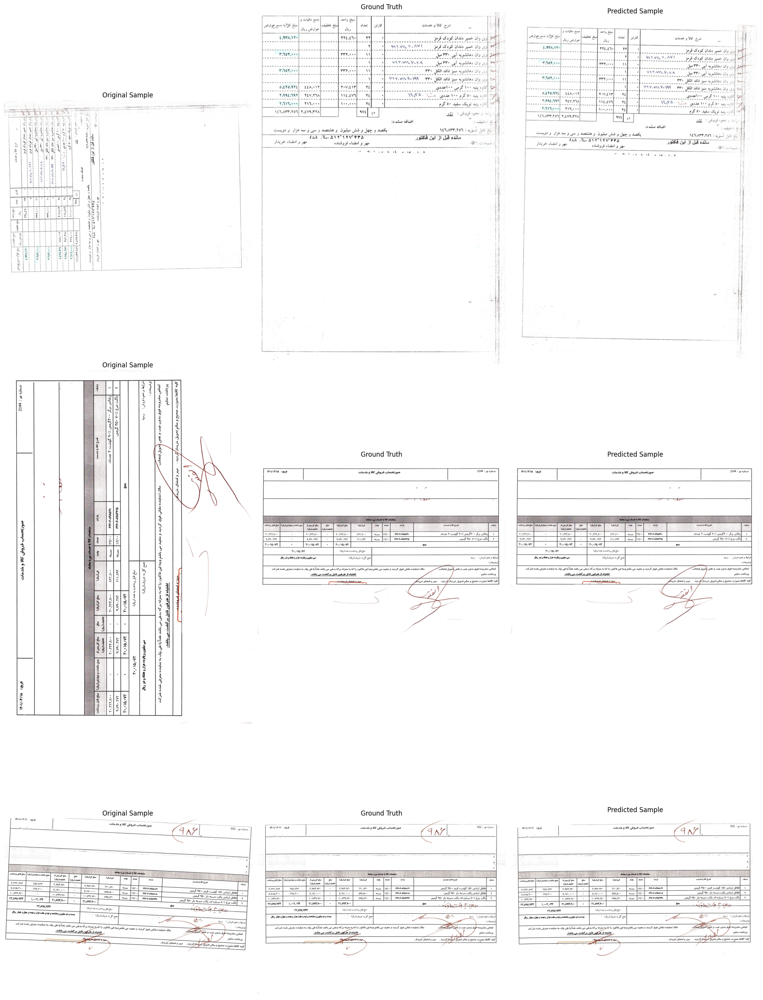

In [323]:
fig, axes = plt.subplots(len(sample_paths), 3, figsize=(20, 30))

for i in range(len(sample_paths)):

    img = cv2.imread(sample_paths[i], cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    original_sample = img.copy()
    ground_truth = cv2.imread(gt_paths[i] ,cv2.COLOR_BGR2GRAY)

    angle = get_image_orient(img)
    oriented_image = orient_image(img ,angle)
    rotated_image = rotate_image(oriented_image)
    
    
    axes[i, 0].imshow(original_sample ,cmap = 'gray')
    axes[i, 0].set_title('Original Sample')
    axes[i, 0].axis('off')
    
    axes[i, 1].imshow(ground_truth,cmap = 'gray')
    axes[i, 1].set_title('Ground Truth')
    axes[i, 1].axis('off')

    axes[i, 2].imshow(rotated_image,cmap = 'gray')
    axes[i, 2].set_title('Predicted Sample')
    axes[i, 2].axis('off')

plt.tight_layout()
plt.show()

# <span style="font-size: 80px;">&#9733;</span> Use  histograms to allign  (SLOW but Accurate) <span style="font-size: 80px;">&#9733;</span>
## Note that this method can be used for Data Labeling (It is perfectly accurate)
If we know rotation range is small this methode would be fast !!

In [270]:
from scipy.ndimage import interpolation as inter
import time

In [290]:
image_index = np.random.randint(0 ,len(base_paths))
oriented_image = predict_and_orient_image(base_paths[image_index], model, load_and_preprocess_image, model_label2name, orient2degree)
image = cv2.imread(base_paths[image_index])


1/1 [==============================] - 0s 87ms/step
Model says original image orientation is : up2down





In [291]:
org_image = image.copy()
gray = cv2.cvtColor(oriented_image, cv2.COLOR_BGR2GRAY)#image

In [292]:
_, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)  # 'threshold' should be '_'

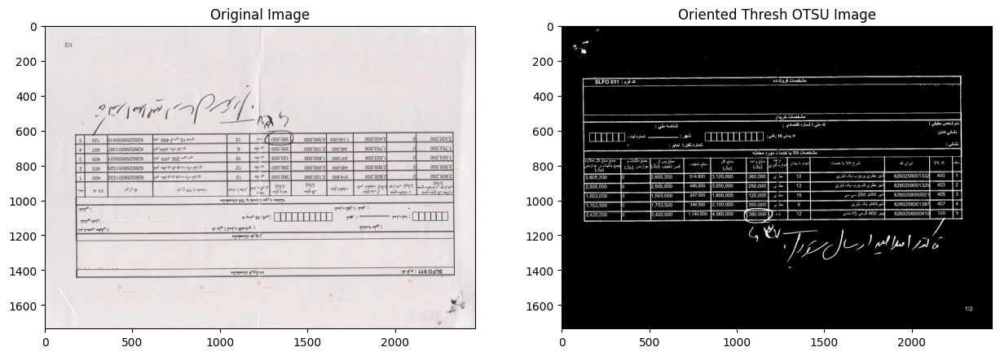

In [293]:
plt.figure(figsize=(15, 15))
plt.subplot(1,2,1);plt.title('Original Image');plt.imshow(org_image ,cmap = 'gray');
plt.subplot(1,2,2);plt.title('Oriented Thresh OTSU Image');plt.imshow(thresh ,cmap = 'gray');

In [294]:
def determine_score(arr, angle):
    # order of 0 indicates that nearest-neighbor interpolation should be used
    data = inter.rotate(arr, angle, reshape=False, order=0)  # ensures that the array's shape remains unchanged (reshape=False).
    histogram = np.sum(data, axis=1, dtype=float) # do sum for each row because of axis = 1
    score = np.sum((histogram[1:] - histogram[:-1]) ** 2, dtype=float)
    return histogram, score

In [295]:
scores = []

limit = 20
step = 0.2
_, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)  # 'threshold' should be '_'
angles = np.arange(-limit, limit + step, step)
st_time = time.time()
for angle in angles:
    histogram, score = determine_score(thresh, angle)
    scores.append(score)
end_time = time.time()
print("Without Optimizing , inf time  : ",end_time - st_time)
best_angle = angles[scores.index(max(scores))]

print('Rotate angle : ',best_angle)

Without Optimizing , inf time  :  14.389281034469604
Rotate angle :  -0.40000000000006963


## Optimize inference time (can be done with 2 method)
*    ### First is using python multiprocessing library

*    ###   Second is resizing image to its half size

In [249]:
import warnings
warnings.filterwarnings('ignore')


In [298]:
from multiprocessing import Pool

# Reduce the resolution for faster processing
width_org = int(org_image.shape[1]) 
height_org = int(org_image.shape[0])
center_org = (width_org // 2, height_org // 2)

scale_percent = 50  # percent of original size
width = int(oriented_image.shape[1] * scale_percent / 100)
height = int(oriented_image.shape[0] * scale_percent / 100)
dim = (width, height)
resized_image = cv2.resize(oriented_image, dim, interpolation=cv2.INTER_AREA)

gray = cv2.cvtColor(resized_image, cv2.COLOR_BGR2GRAY)#image
start_time = time.time()
_, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)  # 'threshold' should be '_'



limit = 20
step = 0.2

def determine_score_wrapper(args):
    return determine_score(*args)

angles = np.arange(-limit, limit + step, step)
st_time = time.time()

with Pool() as pool:
    scores = pool.map(determine_score_wrapper, [(thresh, angle) for angle in angles])

histograms, actual_scores = zip(*scores)
end_time = time.time()

print('Inf time with Optimizing : ' ,end_time - start_time)

best_index = np.argmax(actual_scores)
best_angle = angles[best_index]

print('Rotate angle : ', best_angle)


Inf time with Optimizing :  1.1457676887512207
Rotate angle :  -0.40000000000006963


 #### As you can see inf time speed up 14X

In [300]:
m = cv2.getRotationMatrix2D(center_org, best_angle, 1.0)  
corrected = cv2.warpAffine(oriented_image, m, (width_org, height_org), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)  

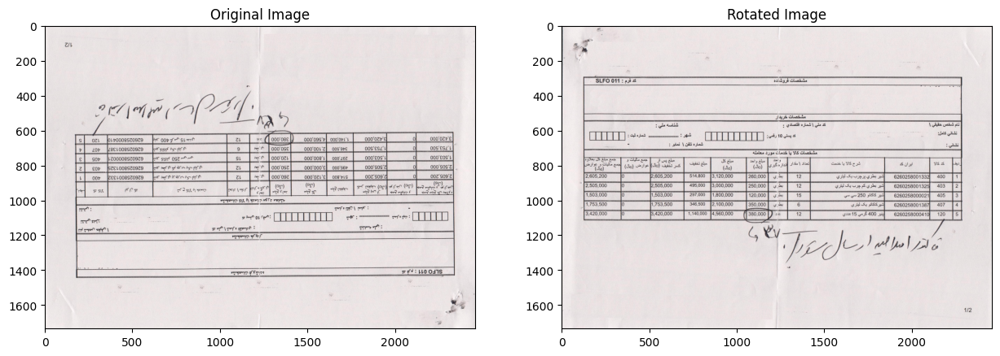

In [301]:
plt.figure(figsize=(15, 15))
plt.subplot(1,2,1);plt.title('Original Image');plt.imshow(org_image ,cmap = 'gray');
plt.subplot(1,2,2);plt.title('Rotated Image');plt.imshow(corrected ,cmap = 'gray');


# <span style="font-size: 80px;">&#9733;</span> Use Histograms Bins (Select Bin with most number of values) Fast <span style="font-size: 80px;">&#9733;</span>

THRESH_BINARY + THRESH_OTSU --> MORPH_OPEN(Rect kernel) --> erode --> Canny --> HoughLinesP --> lines degrees to bins --> select max(bins)

In [10]:
import math
import random
import time

In [24]:
image_index = np.random.randint(0 ,len(base_paths))
oriented_image = predict_and_orient_image(base_paths[image_index], model, load_and_preprocess_image, model_label2name, orient2degree)
image = cv2.imread(base_paths[image_index])

org_image = image.copy()
gray = cv2.cvtColor(oriented_image, cv2.COLOR_BGR2GRAY)#image

1/1 [==============================] - 0s 65ms/step
Model says original image orientation is : up2down





In [26]:
image_index

84

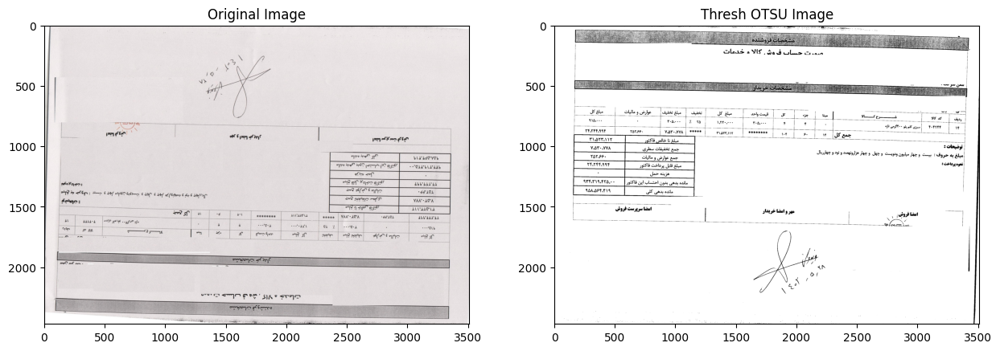

In [25]:
# Blank space to draw hough lines
blank = np.uint8(np.zeros((oriented_image.shape[0], oriented_image.shape[1])))
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (25, 25))

# Binarization
ret2, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

plt.figure(figsize=(15, 15))
plt.subplot(1,2,1);plt.title('Original Image');plt.imshow(org_image ,cmap = 'gray');
plt.subplot(1,2,2);plt.title('Thresh OTSU Image');plt.imshow(thresh ,cmap = 'gray');

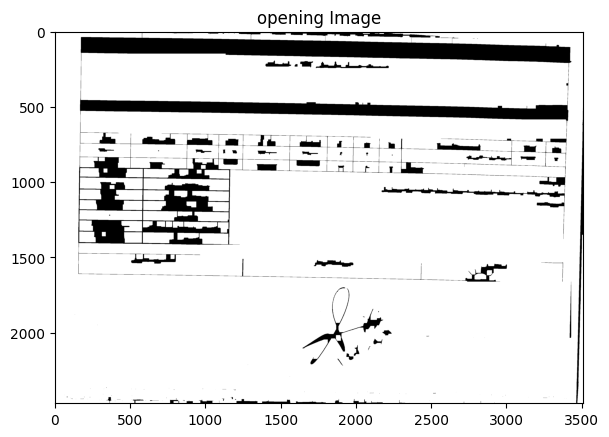

In [46]:
# Denoise
opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel)
plt.figure(figsize=(15, 15))
plt.subplot(1,2,1);plt.title('opening Image');plt.imshow(opening ,cmap = 'gray');


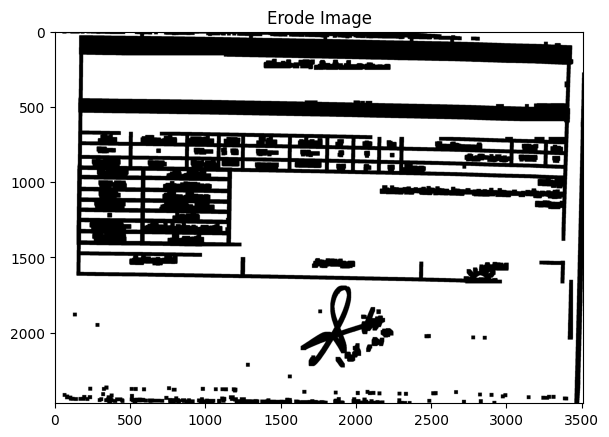

In [47]:
erosion = cv2.erode(opening, kernel)
plt.figure(figsize=(15, 15))
plt.subplot(1,2,1);plt.title('Erode Image');plt.imshow(erosion ,cmap = 'gray');

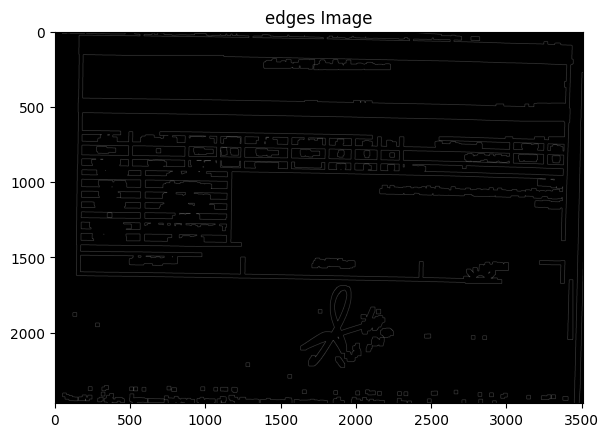

In [48]:
# Canny edge detection
edges = cv2.Canny(erosion, 80, 240, apertureSize=3)
plt.figure(figsize=(15, 15))
plt.subplot(1,2,1);plt.title('edges Image');plt.imshow(edges ,cmap = 'gray');

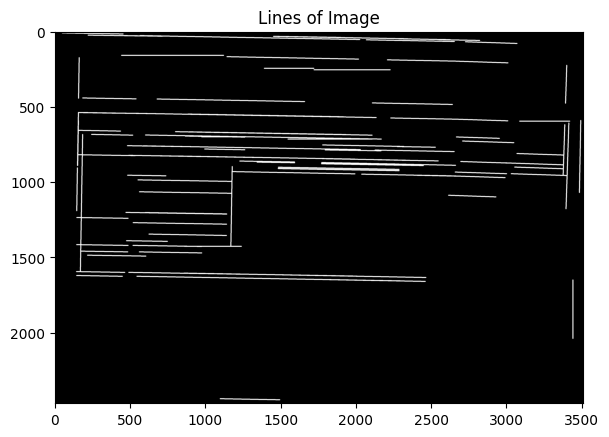

In [49]:
# Hough line transform
lines = cv2.HoughLinesP(edges, 1, np.pi/180, 200, minLineLength=250, maxLineGap=70)
lines1 = lines[:, 0, :]
Theta = []
for x1, y1, x2, y2 in lines1[:]:
    cv2.line(blank, (x1, y1), (x2, y2), (255, 255, 255), 5)
    # Calculate angle
    theta = math.atan2(y1 - y2, x2 - x1)
    Theta.append(theta * 180/np.pi)
    
    
plt.figure(figsize=(15, 15))
plt.subplot(1,2,1);plt.title('Lines of Image');plt.imshow(blank ,cmap = 'gray');

1/1 [==============================] - 0s 69ms/step
Model says original image orientation is : up2down



Inference Time :  141.27540588378906  ms
Detected Degree :  0.999996149517088


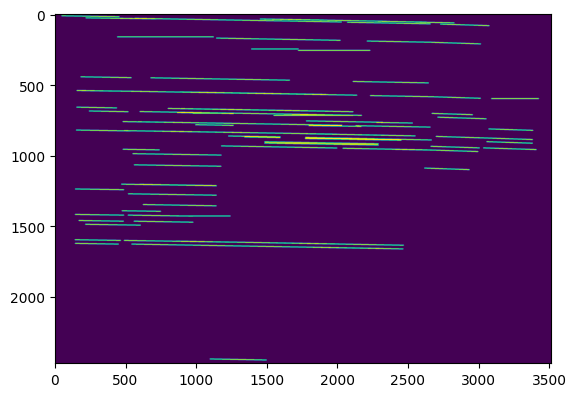

In [52]:
import numpy as np
import cv2
import math
import matplotlib.pyplot as plt
import time

st_time = time.time()

blank = np.zeros((oriented_image.shape[0], oriented_image.shape[1]), dtype=np.uint8)
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (25, 25))

# Binarization
_, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel)
erosion = cv2.erode(opening, kernel)
edges = cv2.Canny(erosion, 80, 240, apertureSize=3)




# Hough line transform
lines = cv2.HoughLinesP(edges, 1, np.pi/180, 200, minLineLength=250, maxLineGap=70)
lines1 = lines[:, 0, :]

Theta = np.arctan2(lines1[:, 1] - lines1[:, 3], lines1[:, 2] - lines1[:, 0]) * 180/np.pi

# Filter vertical lines 
valid_indices = np.where((Theta >= -35) & (Theta <= 35))
Theta = Theta[valid_indices]
lines1 = lines1[valid_indices]


# Rotate
angle_i, angle = np.histogram(Theta, bins=90)
angle_m = angle_i.argmax()
degree = -angle[angle_m]

height, width = image.shape[:2]
heightNew = int(width * abs(math.sin(math.radians(degree))) + height * abs(math.cos(math.radians(degree))))
widthNew = int(height * abs(math.sin(math.radians(degree))) + width * abs(math.cos(math.radians(degree))))
end_time = time.time()
for x1, y1, x2, y2 in lines1:
    cv2.line(blank, (x1, y1), (x2, y2), (255, 255, 255), 5)

oriented_image = predict_and_orient_image(base_paths[image_index], model, load_and_preprocess_image, model_label2name, orient2degree)
M = cv2.getRotationMatrix2D((width/2, height/2), degree, 1)
M[0, 2] += (widthNew - width) / 2
M[1, 2] += (heightNew - height) / 2
res = cv2.warpAffine(oriented_image, M, (widthNew, heightNew))

print('Inference Time : ' ,(end_time - st_time)*1000 ,' ms')
print('Detected Degree : ' ,degree)
plt.imshow(blank)


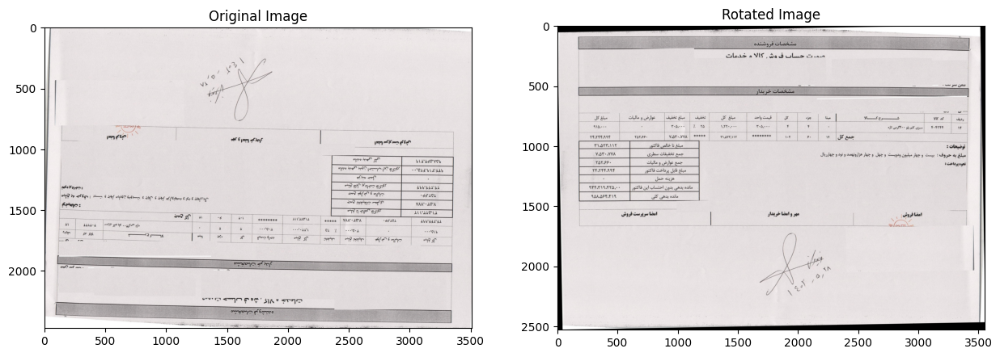

In [51]:
plt.figure(figsize=(15, 15))
plt.subplot(1,2,1);plt.title('Original Image');plt.imshow(org_image ,cmap = 'gray');
plt.subplot(1,2,2);plt.title('Rotated Image');plt.imshow(res ,cmap = 'gray');

## Optimize inference time (can be done with 2 method)
*    ###   First is Vectorizing
*    ###   Second is resizing image to its half size

1/1 [==============================] - 0s 71ms/step
Model says original image orientation is : up2down



Inference Time :  32.5164794921875  ms
Detected Degree :  1.0057251579537017


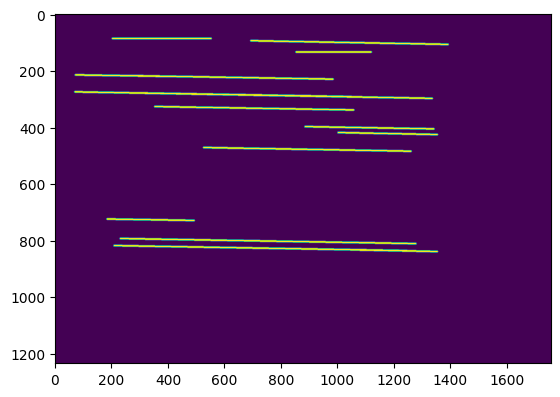

In [55]:
import numpy as np
import cv2
import math
import matplotlib.pyplot as plt
import time
import warnings
warnings.filterwarnings('ignore')

# Reduce the resolution for faster processing
width_org = int(org_image.shape[1]) 
height_org = int(org_image.shape[0])
center_org = (width_org // 2, height_org // 2)

oriented_image = predict_and_orient_image(base_paths[image_index], model, load_and_preprocess_image, model_label2name, orient2degree)
scale_percent = 50  # percent of original size
width = int(oriented_image.shape[1] * scale_percent / 100)
height = int(oriented_image.shape[0] * scale_percent / 100)
dim = (width, height)
resized_image = cv2.resize(oriented_image, dim, interpolation=cv2.INTER_AREA)
gray = cv2.cvtColor(resized_image, cv2.COLOR_BGR2GRAY)#image


st_time = time.time()

blank = np.zeros((resized_image.shape[0], resized_image.shape[1]), dtype=np.uint8)
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (25, 25))

# Binarization
_, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel)
erosion = cv2.erode(opening, kernel)
edges = cv2.Canny(erosion, 80, 240, apertureSize=3)




# Hough line transform
lines = cv2.HoughLinesP(edges, 1, np.pi/180, 200, minLineLength=250, maxLineGap=70)
lines1 = lines[:, 0, :]

Theta = np.arctan2(lines1[:, 1] - lines1[:, 3], lines1[:, 2] - lines1[:, 0]) * 180/np.pi

# Filter vertical lines 
valid_indices = np.where((Theta >= -35) & (Theta <= 35))
Theta = Theta[valid_indices]
lines1 = lines1[valid_indices]


# Rotate
angle_i, angle = np.histogram(Theta, bins=90)
angle_m = angle_i.argmax()
degree = -angle[angle_m]

height, width = image.shape[:2]
heightNew = int(width * abs(math.sin(math.radians(degree))) + height * abs(math.cos(math.radians(degree))))
widthNew = int(height * abs(math.sin(math.radians(degree))) + width * abs(math.cos(math.radians(degree))))
end_time = time.time()
for x1, y1, x2, y2 in lines1:
    cv2.line(blank, (x1, y1), (x2, y2), (255, 255, 255), 5)

M = cv2.getRotationMatrix2D((width/2, height/2), degree, 1)
M[0, 2] += (widthNew - width) / 2
M[1, 2] += (heightNew - height) / 2
res = cv2.warpAffine(oriented_image, M, (widthNew, heightNew))

print('Inference Time : ' ,(end_time - st_time)*1000 ,' ms')
print('Detected Degree : ' ,degree)
plt.imshow(blank)


<span style="font-size: 40px;">&#9733;</span>As we see Inference time improved from 140 ms to 30 ms with resizing image to half size<span style="font-size: 40px;">&#9733;</span>

# <span style="font-size: 80px;">&#9733;</span> Using Horizontal Lines degrees (Good Choice), Fast speed with Vectorizing <span style="font-size: 80px;">&#9733;</span>
GaussianBlur --> THRESH_BINARY_INV+THRESH_OTSU  --> dilate --> HoughLinesP -->filter vertical lines-->filter outliers(IQR)--> mean_degree(horizontal-lines) --> rotation_angle

In [133]:
image_index = np.random.randint(0 ,len(base_paths))

oriented_image = predict_and_orient_image(base_paths[image_index], model, load_and_preprocess_image, model_label2name, orient2degree)
org_image = cv2.imread(base_paths[image_index])
gray = cv2.cvtColor(oriented_image, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray, (5, 5), 0)

1/1 [==============================] - 0s 48ms/step
Model says original image orientation is : down2up





In [134]:
height,width = oriented_image.shape[:2]
center = (width//2, height//2)

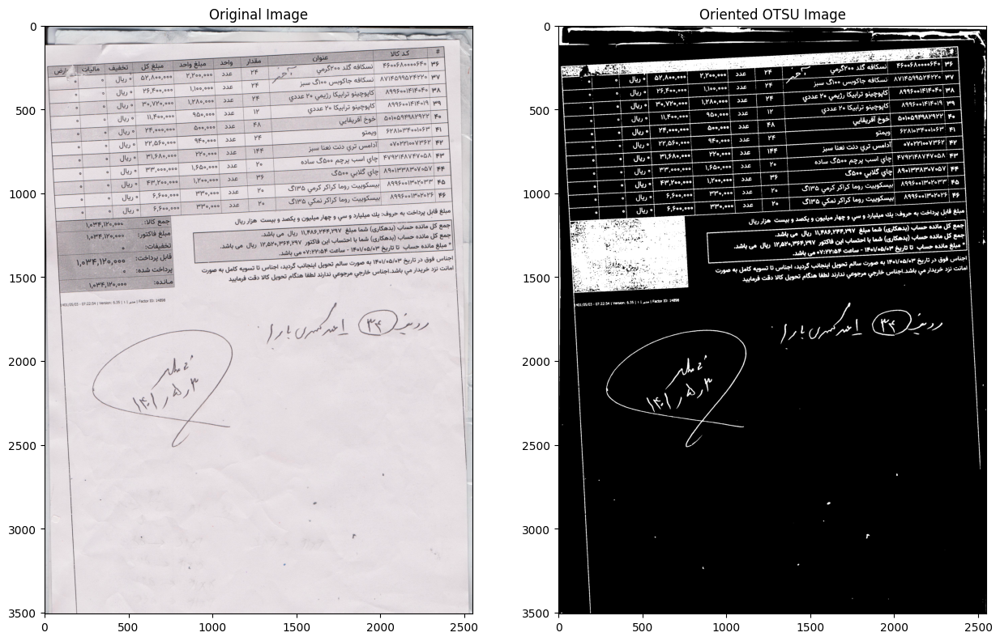

In [135]:

# threshold image
_, threshed = cv2.threshold(blur,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)

plt.figure(figsize=(15, 15))
plt.subplot(1,2,1);plt.title('Original Image');plt.imshow(org_image ,cmap = 'gray');
plt.subplot(1,2,2);plt.title('Oriented OTSU Image');plt.imshow(threshed ,cmap = 'gray');

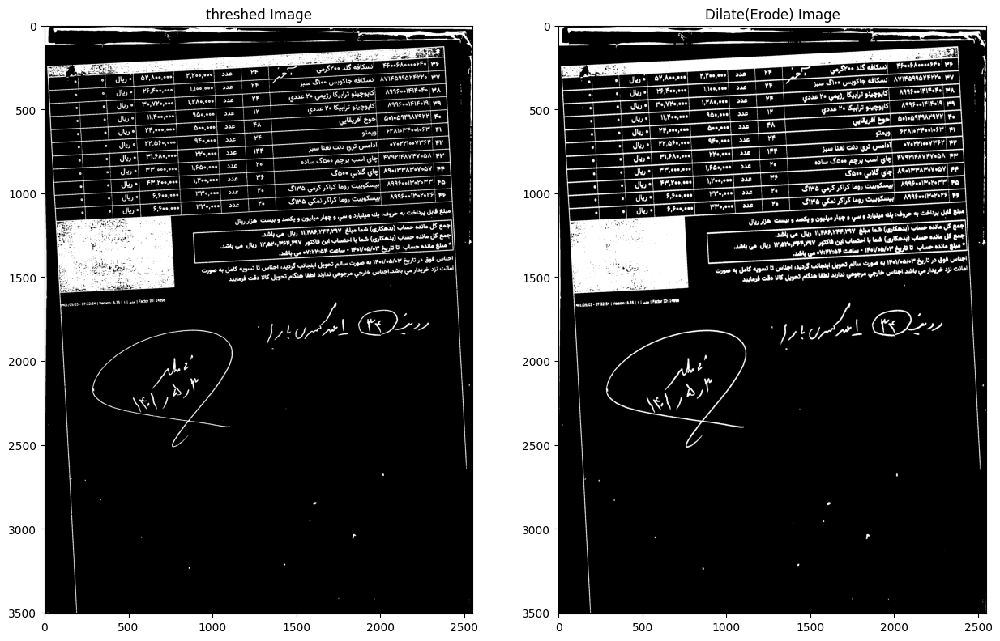

In [136]:
# dilate image
dilate = cv2.dilate(threshed, (35, 35), iterations=3)

plt.figure(figsize=(15, 15))
plt.subplot(1,2,1);plt.title('threshed Image');plt.imshow(threshed ,cmap = 'gray');
plt.subplot(1,2,2);plt.title('Dilate(Erode) Image');plt.imshow(dilate ,cmap = 'gray');

In [137]:
lines = cv2.HoughLinesP(dilate,1,np.pi/180,200,None,150,10)
print("Number of lines detected : {}".format(len(lines)))

Number of lines detected : 983


### Using full image size

Inference Time :  0.6889939308166504
Rotation Angle :  -2.884313890601621


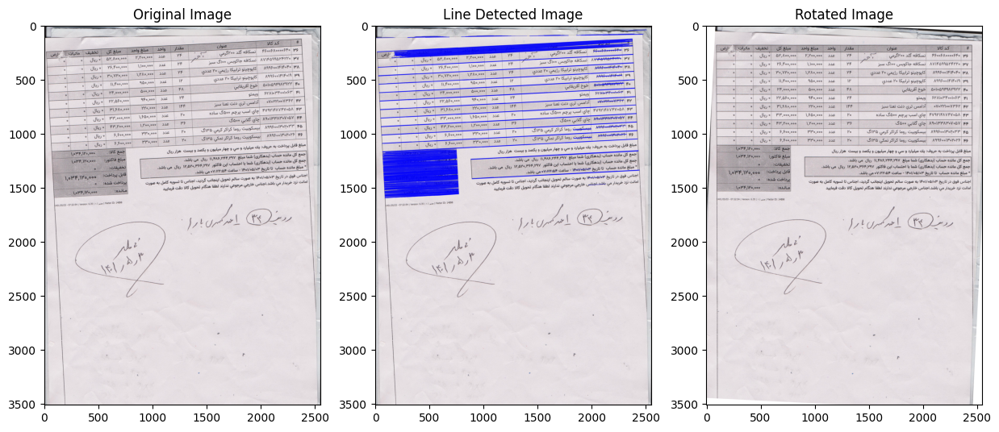

In [143]:
import numpy as np
import cv2
import math
import matplotlib.pyplot as plt
import time
# image_index = np.random.randint(0 ,len(base_paths))
# image = cv2.imread(base_paths[image_index])
# org_image = image.copy()



gray = cv2.cvtColor(oriented_image, cv2.COLOR_BGR2GRAY)
start_time = time.time()

blur = cv2.GaussianBlur(gray, (5, 5), 0)
org_height , org_width= oriented_image.shape[:2]
height,width = oriented_image.shape[:2]
org_center = (width//2, height//2)

center = (width//2, height//2)


# threshold image
_, threshed = cv2.threshold(blur,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)



# dilate image
dilate = cv2.dilate(threshed, (35, 35), iterations=3)
lines = cv2.HoughLinesP(dilate,1,np.pi/180,200,None,150,10)

img_copy = oriented_image.copy()
rotation_angle = None
if lines is not None:
    lines_array = np.squeeze(np.array(lines))
    
    diff_x = lines_array[:, 2] - lines_array[:, 0]
    diff_y = lines_array[:, 3] - lines_array[:, 1]
    
    # Avoid division by zero (vertical lines) by adding a small value
    slopes = diff_y / (diff_x + 1e-10)
    angles = np.degrees(np.arctan(slopes))
    
    # Filter based on angles (horizontal filter)
    horizontal_mask = np.abs(angles) < 30
    
    # Extract horizontal lines based on angle threshold
    horizontal_lines = lines_array[horizontal_mask]
    filtered_angles = angles[horizontal_mask]
    

    # Efficiently compute IQR-based outlier removal using NumPy
    Q1, Q3 = np.percentile(filtered_angles, [25, 75])
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Create a mask to filter out outlier angles
    non_outliers_mask = (filtered_angles >= lower_bound) & (filtered_angles <= upper_bound)

    # Filter out outlier angles and the corresponding horizontal lines
    filtered_angles = filtered_angles[non_outliers_mask]
    final_horizontal_lines = horizontal_lines[non_outliers_mask]
    
    # Draw the final lines without outliers on the image
    if len(filtered_angles) != 0:
        rotation_angle = sum(filtered_angles) / len(filtered_angles)
    print("Inference Time : ",time.time()-start_time)
    print("Rotation Angle : ", rotation_angle)
    # If you need to view the final result, use imshow here (outside the loop)
    for line in final_horizontal_lines:
        cv2.line(img_copy, (line[0], line[1]), (line[2], line[3]), (0, 0, 255), 1, cv2.LINE_AA)

    rotation_matrix = cv2.getRotationMatrix2D(org_center, rotation_angle, 1)
    # rotate orignal image to show transformation
    rotated_image = cv2.warpAffine(oriented_image, rotation_matrix, (org_width, org_height), borderValue=(255, 255, 255))


    plt.figure(figsize=(15, 15))
    plt.subplot(1,3,1);plt.title('Original Image');plt.imshow(org_image ,cmap = 'gray');
    plt.subplot(1,3,2);plt.title('Line Detected Image');plt.imshow(img_copy ,cmap = 'gray');
    plt.subplot(1,3,3);plt.title('Rotated Image');plt.imshow(rotated_image ,cmap = 'gray');    


### Using Half of image size (Time Optimization)

Inference Time with optimization :  0.16397523880004883
Rotation Angle :  -2.795253080623525


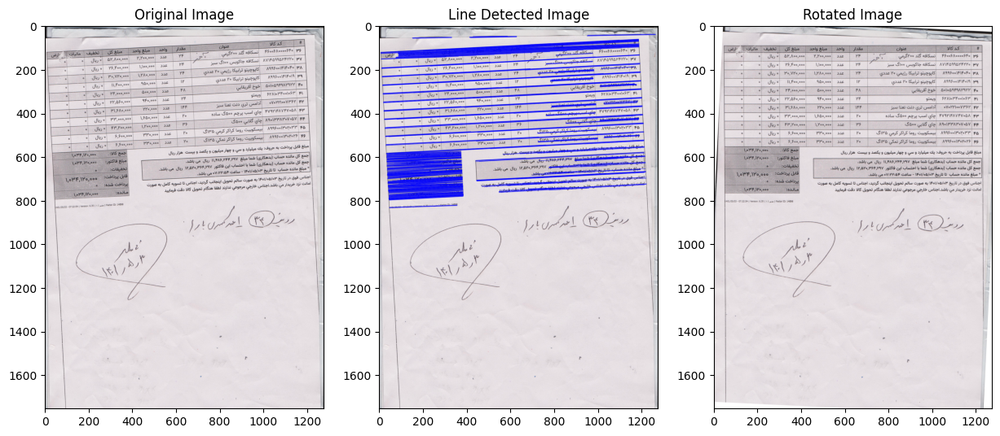

In [145]:
import numpy as np
import cv2
import math
import matplotlib.pyplot as plt
import time
# image_index = np.random.randint(0 ,len(base_paths))
# image = cv2.imread(base_paths[image_index])
# org_image = image.copy()

scale_percent = 50  # percent of original size
width = int(oriented_image.shape[1] * scale_percent / 100)
height = int(oriented_image.shape[0] * scale_percent / 100)
dim = (width, height)
resized_image = cv2.resize(oriented_image, dim, interpolation=cv2.INTER_AREA)
copy_resized_image = resized_image.copy()


gray = cv2.cvtColor(resized_image, cv2.COLOR_BGR2GRAY)
start_time = time.time()

blur = cv2.GaussianBlur(gray, (5, 5), 0)
org_height , org_width= resized_image.shape[:2]
height,width = resized_image.shape[:2]
org_center = (width//2, height//2)

center = (width//2, height//2)


# threshold image
_, threshed = cv2.threshold(blur,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)



# dilate image
dilate = cv2.dilate(threshed, (35, 35), iterations=3)
lines = cv2.HoughLinesP(dilate,1,np.pi/180,200,None,150,10)

img_copy = resized_image.copy()
rotation_angle = None
if lines is not None:
    lines_array = np.squeeze(np.array(lines))
    
    diff_x = lines_array[:, 2] - lines_array[:, 0]
    diff_y = lines_array[:, 3] - lines_array[:, 1]
    
    # Avoid division by zero (vertical lines) by adding a small value
    slopes = diff_y / (diff_x + 1e-10)
    angles = np.degrees(np.arctan(slopes))
    
    # Filter based on angles (horizontal filter)
    horizontal_mask = np.abs(angles) < 30
    
    # Extract horizontal lines based on angle threshold
    horizontal_lines = lines_array[horizontal_mask]
    filtered_angles = angles[horizontal_mask]
    

    # Efficiently compute IQR-based outlier removal using NumPy
    Q1, Q3 = np.percentile(filtered_angles, [25, 75])
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Create a mask to filter out outlier angles
    non_outliers_mask = (filtered_angles >= lower_bound) & (filtered_angles <= upper_bound)

    # Filter out outlier angles and the corresponding horizontal lines
    filtered_angles = filtered_angles[non_outliers_mask]
    final_horizontal_lines = horizontal_lines[non_outliers_mask]
    
    # Draw the final lines without outliers on the image
    if len(filtered_angles) != 0:
        rotation_angle = sum(filtered_angles) / len(filtered_angles)
    print("Inference Time with optimization : ",time.time()-start_time)
    print("Rotation Angle : ", rotation_angle)
    # If you need to view the final result, use imshow here (outside the loop)
    for line in final_horizontal_lines:
        cv2.line(img_copy, (line[0], line[1]), (line[2], line[3]), (0, 0, 255), 1, cv2.LINE_AA)

    rotation_matrix = cv2.getRotationMatrix2D(org_center, rotation_angle, 1)
    # rotate orignal image to show transformation
    rotated_image = cv2.warpAffine(resized_image, rotation_matrix, (org_width, org_height), borderValue=(255, 255, 255))


    plt.figure(figsize=(15, 15))
    plt.subplot(1,3,1);plt.title('Original Image');plt.imshow(resized_image ,cmap = 'gray');
    plt.subplot(1,3,2);plt.title('Line Detected Image');plt.imshow(img_copy ,cmap = 'gray');
    plt.subplot(1,3,3);plt.title('Rotated Image');plt.imshow(rotated_image ,cmap = 'gray');    


* As you can see time inference going down significiently

# Using PCA (Not Complete)

In [ ]:
import cv2
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

images = [cv2.imread(images_path[0], 0), cv2.imread(images_path[6], 0), cv2.imread(images_path[24], 0)]

# Step 1: Deskew the images (remove rotation)
def deskew(image):
    moments = cv2.moments(image)
    if moments['mu02'] > 1e-2:
        skew = moments['mu11'] / moments['mu02']
        M = np.float32([[1, skew, -0.5 * image.shape[1] * skew], [0, 1, 0]])
        image = cv2.warpAffine(image, M, (image.shape[1], image.shape[0]))
    return image

deskewed_images = [deskew(image) for image in images]

# Step 2: Flatten and stack the images
flattened_images = [image.flatten() for image in deskewed_images]
image_matrix = np.vstack(flattened_images)

# Step 3: Apply PCA to reduce dimensionality
num_components = 20  # You can adjust this based on your needs
pca = PCA(n_components=num_components)
pca_result = pca.fit_transform(image_matrix)

# Step 4: Standardize the PCA results
scaler = StandardScaler()
pca_result_scaled = scaler.fit_transform(pca_result)


for i in range(len(images)):
    print(f"Image {i+1} - PCA Components: {pca_result_scaled[i]}")


Rotation Angle: -0.060382095593917315 degrees


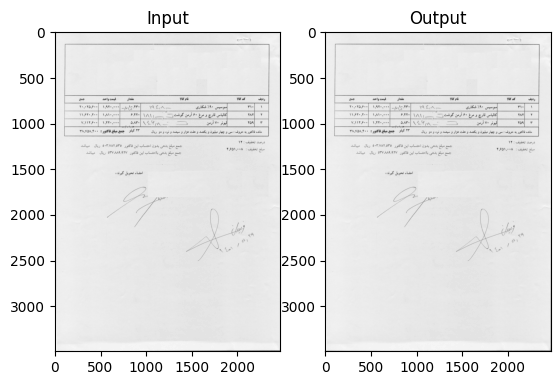

In [172]:
import cv2
import numpy as np

def threshold_and_align(image):
    # Step 1: Thresholding
    _, binary_image = cv2.threshold(image, 128, 255, cv2.THRESH_BINARY)
    
    # Step 2: Apply PCA on nonzero pixels in the binary image
    non_zero_points = np.column_stack(np.where(binary_image > 0))
    
    # Calculate the mean of non-zero pixels
    mean_point = np.mean(non_zero_points, axis=0)
    
    # Compute the covariance matrix and its eigenvalues and eigenvectors
    cov_matrix = np.cov(non_zero_points, rowvar=False)
    eigenvalues, eigenvectors = np.linalg.eigh(cov_matrix)
    
    # Sort eigenvalues and eigenvectors in descending order
    sorted_indices = np.argsort(eigenvalues)[::-1]
    eigenvalues = eigenvalues[sorted_indices]
    eigenvectors = eigenvectors[:, sorted_indices]
    
    # Determine the object rotation about the mean of the object pixels
    principal_angle = np.arctan2(eigenvectors[1, 0], eigenvectors[0, 0])
    
    # Correct for 180˚ rotation problem
    if np.degrees(principal_angle) > 90:
        principal_angle -= np.pi
    
    # Rotate the original image to align with the principal angle
    rows, cols = image.shape
    rotation_matrix = cv2.getRotationMatrix2D((mean_point[1], mean_point[0]), np.degrees(principal_angle), 1)
    aligned_image = cv2.warpAffine(image, rotation_matrix, (cols, rows), flags=cv2.INTER_LINEAR)
    
    return aligned_image, np.degrees(principal_angle)

# Example usage with an input image (replace with your own image)
input_image = cv2.imread(images_path[9], 0)

aligned_image, rotation_angle = threshold_and_align(input_image)

# Print the aligned image and the rotation angle

plt.subplot(121),plt.imshow(input_image ,cmap = 'gray'),plt.title('Input');
plt.subplot(122),plt.imshow(aligned_image ,cmap = 'gray'),plt.title('Output');

print(f"Rotation Angle: {rotation_angle} degrees")


# Generate Data in 4 orientation for training deep learning model
### we have 203 data after generation will be 812

In [ ]:
degree2orient = {270:'right2left' ,90:'left2right' ,180:'up2down' ,0:'down2up'}


In [60]:
image_with_orient['down2up'][5]

'data/base-images/60.jpg'

In [64]:
def orient_image(image, orientation_degree):
    if orientation_degree == 90:
        # Rotate each channel separately
        image = [cv2.flip(channel.T, 0) for channel in cv2.split(image)]
        image = cv2.merge(image)
    elif orientation_degree == 180:
        image = cv2.flip(image, -1)
    elif orientation_degree == 270:
        image = [cv2.flip(channel.T, 1) for channel in cv2.split(image)]
        image = cv2.merge(image)

    return image

In [ ]:
degree2orient = {270:'right2left' ,90:'left2right' ,180:'up2down' ,0:'down2up'}

(2458, 3502, 3)
(3502, 2458, 3)


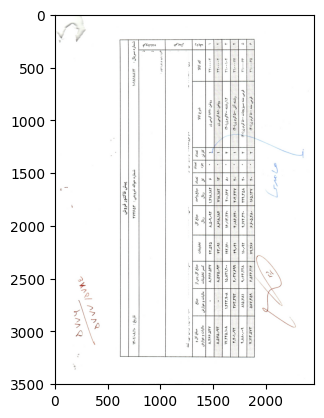

In [75]:
path = image_with_orient['up2down'][5]
image = cv2.imread(path ,cv2.COLOR_BGR2RGB)
print(image.shape)
oriented_image = orient_image(image ,)
print(oriented_image.shape)
plt.imshow(oriented_image)

In [83]:
up2down_images = {'down2up':list() ,'right2left':list(), 'left2right':list()}
for path in image_with_orient['up2down'] :
    image = cv2.imread(path ,cv2.COLOR_BGR2RGB)
    oriented_image_right = orient_image(image ,90)
    oriented_image_up = orient_image(image ,180)
    oriented_image_left = orient_image(image ,270)
    up2down_images['down2up'].append(oriented_image_up)
    up2down_images['right2left'].append(oriented_image_left)
    up2down_images['left2right'].append(oriented_image_right)
   

In [84]:
down2up_images = {'up2down':list() ,'right2left':list(), 'left2right':list()}
for path in image_with_orient['down2up'] :
    image = cv2.imread(path ,cv2.COLOR_BGR2RGB)
    oriented_image_right = orient_image(image ,270)
    oriented_image_down = orient_image(image ,180)
    oriented_image_left = orient_image(image ,90)
    down2up_images['up2down'].append(oriented_image_down)
    down2up_images['right2left'].append(oriented_image_left)
    down2up_images['left2right'].append(oriented_image_right)

In [85]:
left2right_images = {'up2down':list() ,'down2up':list(), 'right2left':list()}
for path in image_with_orient['left2right'] :
    image = cv2.imread(path ,cv2.COLOR_BGR2RGB)
    oriented_image_up = orient_image(image ,90)
    oriented_image_down = orient_image(image ,270)
    oriented_image_left = orient_image(image ,180)
    left2right_images['up2down'].append(oriented_image_down)
    left2right_images['down2up'].append(oriented_image_up)
    left2right_images['right2left'].append(oriented_image_left)
    

In [86]:
right2left_images = {'up2down':list() ,'down2up':list(), 'left2right':list()}
for path in image_with_orient['right2left'] :
    image = cv2.imread(path ,cv2.COLOR_BGR2RGB)
    oriented_image_up = orient_image(image ,270)
    oriented_image_down = orient_image(image ,90)
    oriented_image_right = orient_image(image ,180)
    right2left_images['up2down'].append(oriented_image_down)
    right2left_images['down2up'].append(oriented_image_up)
    right2left_images['left2right'].append(oriented_image_right)
    

In [101]:
down2up_all = {'images':list() ,'label':1}
for image in up2down_images['down2up'] :
    down2up_all['images'].append(image)
for image in left2right_images['down2up'] :
    down2up_all['images'].append(image)
for image in right2left_images['down2up'] :
    down2up_all['images'].append(image)

    
for path in image_with_orient['down2up'] :
    image = cv2.imread(path ,cv2.COLOR_BGR2RGB)
    down2up_all['images'].append(image)

In [91]:
for i ,image in enumerate(down2up_all['images']) :
    cv2.imwrite(f'./new_data/down2up/{i}.jpeg' ,image)

In [100]:
up2down_all = {'images':list() ,'label':2}
for image in down2up_images['up2down'] :
    up2down_all['images'].append(image)
for image in left2right_images['up2down'] :
    up2down_all['images'].append(image)
for image in right2left_images['up2down'] :
    up2down_all['images'].append(image)

    
for path in image_with_orient['up2down'] :
    image = cv2.imread(path ,cv2.COLOR_BGR2RGB)
    up2down_all['images'].append(image)

In [94]:
for i ,image in enumerate(up2down_all['images']) :
    cv2.imwrite(f'./new_data/up2down/{i}.jpeg' ,image)

In [99]:
left2right_all = {'images':list() ,'label':3}
for image in down2up_images['left2right'] :
    left2right_all['images'].append(image)
for image in right2left_images['left2right'] :
    left2right_all['images'].append(image)
for image in up2down_images['left2right'] :
    left2right_all['images'].append(image)

    
for path in image_with_orient['left2right'] :
    image = cv2.imread(path ,cv2.COLOR_BGR2RGB)
    left2right_all['images'].append(image)

In [96]:
for i ,image in enumerate(left2right_all['images']) :
    cv2.imwrite(f'./new_data/left2right/{i}.jpeg' ,image)

In [97]:
right2left_all = {'images':list() ,'label':4}
for image in down2up_images['right2left'] :
    right2left_all['images'].append(image)
for image in left2right_images['right2left'] :
    right2left_all['images'].append(image)
for image in up2down_images['right2left'] :
    right2left_all['images'].append(image)

    
for path in image_with_orient['right2left'] :
    image = cv2.imread(path ,cv2.COLOR_BGR2RGB)
    right2left_all['images'].append(image)

In [98]:
for i ,image in enumerate(right2left_all['images']) :
    cv2.imwrite(f'./new_data/right2left/{i}.jpeg' ,image)